# Train Mask R-CNN model using Detectron2 library to make image segmentation over strawberry fruits 

**Description**: This Notebook let us to train a Mask R-CNN model using Detectron2 library in order to make image segmentaton over strawberry fruits. Here, we define different functions to make:

1. Set Up the config to make the training.
2. Compute evalution metris both in training and validation dataset using Coco Evaluator. The primcipal used metric is mAP.
3. Train the model
4. Evaluate the model over the test dataset and compute mAP.
5. Make inference over images
6. Make inference over a video.

**AUTHORS**: Anthony Crepo and Claudia Moncada.

All the code on this Notebook was based in the official [Detectron2 repository](https://github.com/facebookresearch/detectron2).

**Note**: In our particular case, we use our Google Drive unit to import Datasets, annotations, also save models and output data. Make sure to change the Google Drive paths according to your files and folders.

## Mount Drive Unit

Watch GPU info.

In [ ]:
!nvidia-smi

Mon Feb  6 20:39:37 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 510.47.03    Driver Version: 510.47.03    CUDA Version: 11.6     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   37C    P8     9W /  70W |      3MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
# mount Google Drive
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


### Import dataset in coco annotations

Copy images and unzip.

In [ ]:
!cp /content/gdrive/MyDrive/AI_PROJECTS/STRAWBERRY_MASKRCNN/DATASET/StrawDI_Db1.zip .

In [ ]:
!unzip /content/StrawDI_Db1.zip

Streaming output truncated to the last 5000 lines.
  inflating: StrawDI_Db1/train/img/180.png  
  inflating: StrawDI_Db1/train/img/1800.png  
  inflating: StrawDI_Db1/train/img/1801.png  
  inflating: StrawDI_Db1/train/img/1802.png  
  inflating: StrawDI_Db1/train/img/1804.png  
  inflating: StrawDI_Db1/train/img/1805.png  
  inflating: StrawDI_Db1/train/img/1806.png  
  inflating: StrawDI_Db1/train/img/1807.png  
  inflating: StrawDI_Db1/train/img/1808.png  
  inflating: StrawDI_Db1/train/img/1809.png  
  inflating: StrawDI_Db1/train/img/181.png  
  inflating: StrawDI_Db1/train/img/1810.png  
  inflating: StrawDI_Db1/train/img/1811.png  
  inflating: StrawDI_Db1/train/img/1812.png  
  inflating: StrawDI_Db1/train/img/1814.png  
  inflating: StrawDI_Db1/train/img/1815.png  
  inflating: StrawDI_Db1/train/img/1816.png  
  inflating: StrawDI_Db1/train/img/1817.png  
  inflating: StrawDI_Db1/train/img/1818.png  
  inflating: StrawDI_Db1/train/img/1819.png  
  inflating: StrawDI_Db1/train/

Copy labels in Coco format, i.e, in json.

In [ ]:
!cp /content/gdrive/MyDrive/AI_PROJECTS/STRAWBERRY_MASKRCNN/DATASET/annotations/train.json .
!cp /content/gdrive/MyDrive/AI_PROJECTS/STRAWBERRY_MASKRCNN/DATASET/annotations/val.json .
!cp /content/gdrive/MyDrive/AI_PROJECTS/STRAWBERRY_MASKRCNN/DATASET/annotations/test.json .

## Install detectron2

In [ ]:
#@title Install dependencies
# install dependencies: (use cu101 because colab has CUDA 10.1)
#!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 KB 3.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyyaml: filename=PyYAML-5.1-cp38-cp38-linux_x86_64.whl size=44089 sha256=72906b8eeea801ac6727507ec9257912611fabeb88da64a55d76914964ec8ad0
  Stored in directory: /root/.cache/pip/wheels/52/dd/2b/10ff8b0ac81b93946bb5fb9e6749bae2dac246506c8774e6cf
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0
    Uninstalling PyYAML-6.0:
      Successfully uninstalled PyYAML-6.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask 2022.2.1 requires pyyaml>=5.3.1, but you have pyyaml 5.1 which is incompatible.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheel

### Install Detectron2

In [ ]:
%cd /content/
# install detectron resnest
!python -m pip install 'git+https://github.com/zhanghang1989/detectron2-ResNeSt.git'
import detectron2

/content
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/zhanghang1989/detectron2-ResNeSt.git to /tmp/pip-req-build-htlynbz8
  Running command git clone --filter=blob:none --quiet https://github.com/zhanghang1989/detectron2-ResNeSt.git /tmp/pip-req-build-htlynbz8
  Resolved https://github.com/zhanghang1989/detectron2-ResNeSt.git to commit 54ec87602bad7ee3e398b64fa9af335539c184d0
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Created wheel for detectron2: filename=detectron2-0.1.1-cp38-cp38-linux_x86_64.whl size=5596637 sha256=fadb72e106cb54f7f12bee3f11aad0842d4a19296ee4dcc8e2e702110c6c4192
  Stored in directory: /tmp/pip-ephem-wheel-cache-mtn1zgd_/wheels/09/8e/d6/580afe30bd3d93e82363a8bd29fa9dda02df2a05183b0ae6aa
  Created wheel for fvcore: filename=fvcore-0.1.dev200407-py3-none-any.whl size=38759 sha256=c8b47d64e9ac036502c84a0db03a9d6a6b0d744daa3fffb6fd8afdceb744cd0f
  

## Register dataset (If annotations in Coco Format)

In [ ]:
# Use the following code to directly register your dataset for training using the generated MSCOCO format json files.

from detectron2.data.datasets import register_coco_instances

register_coco_instances("train", {}, "/content/train.json", "/content/dataset/train/img/") # Registers a dataset named "Dataset_train" by taking annotations from the "Dataset_train.json" file.
register_coco_instances("val", {}, "/content/val.json", "/content/dataset/val/img/")
register_coco_instances("test", {}, "/content/test.json", "/content/dataset/test/img/")
#dataset_metadata = MetadataCatalog.get("Dataset_train").set(thing_classes=['Class_one', 'Class_two', 'Class_three'])

## Train MaskRCNN on custom dataset with Detectron2 in 4 steps

1. Make a directory to save the training outputs.

In [ ]:
!mkdir outputs

2. Define the configs for training.

In [ ]:
from detectron2.config import get_cfg
from detectron2 import model_zoo
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
#from detectron2.engine import DefaultTrainer



def custom_config(num_classes):
    cfg = get_cfg()
    
    # get configuration from model_zoo
    cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
    cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")

    # Model
    #cfg.MODEL.MASK_ON = True
    cfg.MODEL.ROI_HEADS.NUM_CLASSES = num_classes
    #cfg.MODEL.BACKBONE.NAME = "build_resnet_backbone"
    #cfg.MODEL.RESNETS.DEPTH = 50

    # Input

    #cfg.INPUT.MIN_SIZE_TRAIN = (419,)
    # Sample size of smallest side by choice or random selection from range give by
    # INPUT.MIN_SIZE_TRAIN
    #cfg.INPUT.MIN_SIZE_TRAIN_SAMPLING = "choice"
    # Maximum size of the side of the image during training
    #cfg.INPUT.MAX_SIZE_TRAIN = 419
    # Size of the smallest side of the image during testing. Set to zero to disable resize in testing.
    #cfg.INPUT.MIN_SIZE_TEST = 419
    # Maximum size of the side of the image during testing
    #cfg.INPUT.MAX_SIZE_TEST = 419
    
    
    # Solver
    cfg.SOLVER.BASE_LR = 0.01
    cfg.SOLVER.MOMENTUM = 0.9
    ##cfg.SOLVER.WEIGHT_DECAY = 0.0001
    #cfg.SOLVER.gamma = 0.0001
    cfg.SOLVER.gamma = 0.1
    cfg.SOLVER.MAX_ITER = 4000
    cfg.SOLVER.STEPS = (1000, 2000,3000)
    cfg.SOLVER.NUM_DECAYS = 3
    
    cfg.SOLVER.IMS_PER_BATCH = 8
    cfg.SOLVER.CHECKPOINT_PERIOD = 200  
    
    # Test
    cfg.TEST.DETECTIONS_PER_IMAGE = 20
    cfg.TEST.EVAL_PERIOD = 200

    # DATASETS
    cfg.DATASETS.TEST = ('val',)
    #cfg.DATASETS.TEST = ('test',)
    cfg.DATASETS.TRAIN = ('train',)
    
    # DATASETS
    cfg.OUTPUT_DIR = "/content/outputs"
    
    return cfg

3. Define a custom trainer in order to compute the loss in train and val dataset.

In [ ]:
from detectron2.engine.hooks import HookBase
from detectron2.evaluation import inference_context
from detectron2.utils.logger import log_every_n_seconds
from detectron2.data import DatasetMapper, build_detection_test_loader
import detectron2.utils.comm as comm
import torch
import time
import datetime
import logging
import numpy as np


class LossEvalHook(HookBase):
    def __init__(self, eval_period, model, data_loader):
        self._model = model
        self._period = eval_period
        self._data_loader = data_loader
    
    def _do_loss_eval(self):
        # Copying inference_on_dataset from evaluator.py
        total = len(self._data_loader)
        num_warmup = min(5, total - 1)
            
        start_time = time.perf_counter()
        total_compute_time = 0
        losses = []
        for idx, inputs in enumerate(self._data_loader):            
            if idx == num_warmup:
                start_time = time.perf_counter()
                total_compute_time = 0
            start_compute_time = time.perf_counter()
            if torch.cuda.is_available():
                torch.cuda.synchronize()
            total_compute_time += time.perf_counter() - start_compute_time
            iters_after_start = idx + 1 - num_warmup * int(idx >= num_warmup)
            seconds_per_img = total_compute_time / iters_after_start
            if idx >= num_warmup * 2 or seconds_per_img > 5:
                total_seconds_per_img = (time.perf_counter() - start_time) / iters_after_start
                eta = datetime.timedelta(seconds=int(total_seconds_per_img * (total - idx - 1)))
                log_every_n_seconds(
                    logging.INFO,
                    "Loss on Validation  done {}/{}. {:.4f} s / img. ETA={}".format(
                        idx + 1, total, seconds_per_img, str(eta)
                    ),
                    n=5,
                )
            loss_batch = self._get_loss(inputs)
            losses.append(loss_batch)
        mean_loss = np.mean(losses)
        self.trainer.storage.put_scalar('validation_loss', mean_loss)
        comm.synchronize()

        return losses
            
    def _get_loss(self, data):
        # How loss is calculated on train_loop 
        metrics_dict = self._model(data)
        metrics_dict = {
            k: v.detach().cpu().item() if isinstance(v, torch.Tensor) else float(v)
            for k, v in metrics_dict.items()
        }
        total_losses_reduced = sum(loss for loss in metrics_dict.values())
        return total_losses_reduced
        
        
    def after_step(self):
        next_iter = self.trainer.iter + 1
        is_final = next_iter == self.trainer.max_iter
        if is_final or (self._period > 0 and next_iter % self._period == 0):
            self._do_loss_eval()
        self.trainer.storage.put_scalars(timetest=12)

In [ ]:
from detectron2.evaluation import COCOEvaluator
from detectron2.engine import DefaultTrainer
import os

class MyTrainer(DefaultTrainer):
    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        if output_folder is None:
            output_folder = os.path.join(cfg.OUTPUT_DIR, "inference")
        return COCOEvaluator(dataset_name, cfg, True, output_folder)
                     
    def build_hooks(self):
        hooks = super().build_hooks()
        hooks.insert(-1,LossEvalHook(
            cfg.TEST.EVAL_PERIOD,
            self.model,
            build_detection_test_loader(
                self.cfg,
                self.cfg.DATASETS.TEST[0],
                DatasetMapper(self.cfg,True)
            )
        ))
        return hooks
           

See all `cfg` (only for informative purpose). 

In [ ]:
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator
from detectron2.data.datasets.coco import convert_to_coco_json

  
if __name__ == '__main__':

  num_classes = 1
  cfg = custom_config(num_clases)

  print(cfg.INPUT.MIN_SIZE_TRAIN)
  print(cfg.INPUT.MAX_SIZE_TRAIN)
  print(cfg.INPUT.MIN_SIZE_TRAIN_SAMPLING)

  print(cfg)

(640, 672, 704, 736, 768, 800)
1333
choice
CUDNN_BENCHMARK: False
DATALOADER:
  ASPECT_RATIO_GROUPING: True
  FILTER_EMPTY_ANNOTATIONS: True
  NUM_WORKERS: 4
  REPEAT_THRESHOLD: 0.0
  SAMPLER_TRAIN: TrainingSampler
DATASETS:
  PRECOMPUTED_PROPOSAL_TOPK_TEST: 1000
  PRECOMPUTED_PROPOSAL_TOPK_TRAIN: 2000
  PROPOSAL_FILES_TEST: ()
  PROPOSAL_FILES_TRAIN: ()
  TEST: ('val',)
  TRAIN: ('train',)
GLOBAL:
  HACK: 1.0
INPUT:
  CROP:
    ENABLED: False
    SIZE: [0.9, 0.9]
    TYPE: relative_range
  FORMAT: BGR
  MASK_FORMAT: polygon
  MAX_SIZE_TEST: 1333
  MAX_SIZE_TRAIN: 1333
  MIN_SIZE_TEST: 800
  MIN_SIZE_TRAIN: (640, 672, 704, 736, 768, 800)
  MIN_SIZE_TRAIN_SAMPLING: choice
MODEL:
  ANCHOR_GENERATOR:
    ANGLES: [[-90, 0, 90]]
    ASPECT_RATIOS: [[0.5, 1.0, 2.0]]
    NAME: DefaultAnchorGenerator
    OFFSET: 0.0
    SIZES: [[32], [64], [128], [256], [512]]
  BACKBONE:
    FREEZE_AT: 2
    NAME: build_resnet_fpn_backbone
  DEVICE: cuda
  FPN:
    FUSE_TYPE: sum
    IN_FEATURES: ['res2', 're

4. Begin training.

In [ ]:
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator
from detectron2.data.datasets.coco import convert_to_coco_json

  
if __name__ == '__main__':

  num_classes = 1
  cfg = custom_config(num_clases)

  #Trainer
  trainer = MyTrainer(cfg)
  trainer.resume_or_load(resume=False)
  trainer.train()

[02/06 20:50:00 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[02/06 20:50:07 d2.data.detection_utils]: TransformGens used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]
WARNING [02/06 20:50:07 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[02/06 20:50:07 d2.data.datasets.coco]: Loaded 100 images in COCO format from /content/val.json
[02/06 20:50:07 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
| strawberry | 572          |
|            |              |
[02/06 20:50:07 d2.data.common]: Serializing 100 elements to byte tensors and concatenating them all ...
[02/06 20:50:07 d2.data.common]: Serialized dataset takes 0.29 MiB


/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
model_final_f10217.pkl: 178MB [00:15, 11.7MB/s]                           


[02/06 20:50:25 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list t

[02/06 20:51:12 d2.utils.events]:  eta: 2:08:56  iter: 19  total_loss: 1.774  loss_cls: 0.478  loss_box_reg: 0.300  loss_mask: 0.653  loss_rpn_cls: 0.235  loss_rpn_loc: 0.046  time: 1.9394  data_time: 0.0844  lr: 0.000200  max_mem: 9666M
[02/06 20:51:50 d2.utils.events]:  eta: 2:08:07  iter: 39  total_loss: 1.005  loss_cls: 0.233  loss_box_reg: 0.298  loss_mask: 0.361  loss_rpn_cls: 0.062  loss_rpn_loc: 0.032  time: 1.9303  data_time: 0.0569  lr: 0.000400  max_mem: 9667M
[02/06 20:52:31 d2.utils.events]:  eta: 2:09:05  iter: 59  total_loss: 0.809  loss_cls: 0.166  loss_box_reg: 0.325  loss_mask: 0.224  loss_rpn_cls: 0.044  loss_rpn_loc: 0.033  time: 1.9691  data_time: 0.0636  lr: 0.000599  max_mem: 9667M
[02/06 20:53:15 d2.utils.events]:  eta: 2:11:52  iter: 79  total_loss: 0.592  loss_cls: 0.103  loss_box_reg: 0.301  loss_mask: 0.140  loss_rpn_cls: 0.038  loss_rpn_loc: 0.031  time: 2.0220  data_time: 0.0693  lr: 0.000799  max_mem: 9667M
[02/06 20:53:59 d2.utils.events]:  eta: 2:13:17 

/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list t

[02/06 20:57:59 detectron2]: Loss on Validation  done 11/100. 0.0001 s / img. ETA=0:00:08
[02/06 20:58:05 detectron2]: Loss on Validation  done 45/100. 0.0001 s / img. ETA=0:00:07
[02/06 20:58:10 detectron2]: Loss on Validation  done 87/100. 0.0001 s / img. ETA=0:00:01
[02/06 20:58:11 d2.utils.events]:  eta: 2:16:56  iter: 199  total_loss: 0.381  loss_cls: 0.075  loss_box_reg: 0.146  loss_mask: 0.117  loss_rpn_cls: 0.018  loss_rpn_loc: 0.028  validation_loss: 0.370  time: 2.1382  data_time: 0.0559  lr: 0.001998  max_mem: 9667M
[02/06 20:58:56 d2.utils.events]:  eta: 2:16:41  iter: 219  total_loss: 0.423  loss_cls: 0.080  loss_box_reg: 0.162  loss_mask: 0.119  loss_rpn_cls: 0.024  loss_rpn_loc: 0.027  validation_loss: 0.370  time: 2.1461  data_time: 0.0652  lr: 0.002198  max_mem: 9667M
[02/06 20:59:41 d2.utils.events]:  eta: 2:17:24  iter: 239  total_loss: 0.386  loss_cls: 0.074  loss_box_reg: 0.146  loss_mask: 0.109  loss_rpn_cls: 0.018  loss_rpn_loc: 0.025  validation_loss: 0.370  tim

/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list t

[02/06 21:06:12 detectron2]: Loss on Validation  done 11/100. 0.0001 s / img. ETA=0:00:08
[02/06 21:06:17 detectron2]: Loss on Validation  done 53/100. 0.0001 s / img. ETA=0:00:05
[02/06 21:06:22 detectron2]: Loss on Validation  done 93/100. 0.0001 s / img. ETA=0:00:00
[02/06 21:06:23 d2.utils.events]:  eta: 2:14:42  iter: 399  total_loss: 0.358  loss_cls: 0.070  loss_box_reg: 0.138  loss_mask: 0.098  loss_rpn_cls: 0.020  loss_rpn_loc: 0.021  validation_loss: 0.345  time: 2.2237  data_time: 0.0616  lr: 0.003996  max_mem: 9667M
[02/06 21:07:08 d2.utils.events]:  eta: 2:14:13  iter: 419  total_loss: 0.428  loss_cls: 0.078  loss_box_reg: 0.157  loss_mask: 0.118  loss_rpn_cls: 0.021  loss_rpn_loc: 0.033  validation_loss: 0.345  time: 2.2259  data_time: 0.0578  lr: 0.004196  max_mem: 9667M
[02/06 21:07:54 d2.utils.events]:  eta: 2:13:37  iter: 439  total_loss: 0.395  loss_cls: 0.081  loss_box_reg: 0.138  loss_mask: 0.115  loss_rpn_cls: 0.016  loss_rpn_loc: 0.026  validation_loss: 0.345  tim

/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list t

[02/06 21:14:26 detectron2]: Loss on Validation  done 11/100. 0.0001 s / img. ETA=0:00:08
[02/06 21:14:31 detectron2]: Loss on Validation  done 47/100. 0.0001 s / img. ETA=0:00:07
[02/06 21:14:36 detectron2]: Loss on Validation  done 84/100. 0.0001 s / img. ETA=0:00:02
[02/06 21:14:38 d2.utils.events]:  eta: 2:09:11  iter: 599  total_loss: 0.365  loss_cls: 0.083  loss_box_reg: 0.152  loss_mask: 0.093  loss_rpn_cls: 0.011  loss_rpn_loc: 0.017  validation_loss: 0.338  time: 2.2556  data_time: 0.0698  lr: 0.005994  max_mem: 9667M
[02/06 21:15:24 d2.utils.events]:  eta: 2:08:29  iter: 619  total_loss: 0.381  loss_cls: 0.075  loss_box_reg: 0.146  loss_mask: 0.099  loss_rpn_cls: 0.012  loss_rpn_loc: 0.020  validation_loss: 0.338  time: 2.2565  data_time: 0.0584  lr: 0.006194  max_mem: 9667M
[02/06 21:16:10 d2.utils.events]:  eta: 2:07:49  iter: 639  total_loss: 0.363  loss_cls: 0.076  loss_box_reg: 0.148  loss_mask: 0.098  loss_rpn_cls: 0.013  loss_rpn_loc: 0.023  validation_loss: 0.338  tim

/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list t

[02/06 21:22:40 detectron2]: Loss on Validation  done 11/100. 0.0001 s / img. ETA=0:00:08
[02/06 21:22:45 detectron2]: Loss on Validation  done 53/100. 0.0001 s / img. ETA=0:00:05
[02/06 21:22:50 detectron2]: Loss on Validation  done 91/100. 0.0001 s / img. ETA=0:00:01
[02/06 21:22:51 d2.utils.events]:  eta: 2:01:58  iter: 799  total_loss: 0.349  loss_cls: 0.079  loss_box_reg: 0.134  loss_mask: 0.097  loss_rpn_cls: 0.013  loss_rpn_loc: 0.019  validation_loss: 0.347  time: 2.2696  data_time: 0.0633  lr: 0.007992  max_mem: 9736M
[02/06 21:23:37 d2.utils.events]:  eta: 2:01:12  iter: 819  total_loss: 0.357  loss_cls: 0.076  loss_box_reg: 0.134  loss_mask: 0.098  loss_rpn_cls: 0.018  loss_rpn_loc: 0.024  validation_loss: 0.347  time: 2.2697  data_time: 0.0658  lr: 0.008192  max_mem: 9736M
[02/06 21:24:22 d2.utils.events]:  eta: 2:00:25  iter: 839  total_loss: 0.337  loss_cls: 0.071  loss_box_reg: 0.136  loss_mask: 0.101  loss_rpn_cls: 0.015  loss_rpn_loc: 0.023  validation_loss: 0.347  tim

/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list t

[02/06 21:30:51 detectron2]: Loss on Validation  done 11/100. 0.0001 s / img. ETA=0:00:09
[02/06 21:30:56 detectron2]: Loss on Validation  done 49/100. 0.0001 s / img. ETA=0:00:06
[02/06 21:31:01 detectron2]: Loss on Validation  done 84/100. 0.0001 s / img. ETA=0:00:02
[02/06 21:31:04 d2.utils.events]:  eta: 1:54:54  iter: 999  total_loss: 0.367  loss_cls: 0.071  loss_box_reg: 0.140  loss_mask: 0.089  loss_rpn_cls: 0.012  loss_rpn_loc: 0.023  validation_loss: 0.356  time: 2.2776  data_time: 0.0593  lr: 0.009990  max_mem: 9736M
[02/06 21:31:50 d2.utils.events]:  eta: 1:54:17  iter: 1019  total_loss: 0.313  loss_cls: 0.063  loss_box_reg: 0.129  loss_mask: 0.085  loss_rpn_cls: 0.007  loss_rpn_loc: 0.015  validation_loss: 0.356  time: 2.2788  data_time: 0.0560  lr: 0.001000  max_mem: 9736M
[02/06 21:32:38 d2.utils.events]:  eta: 1:53:41  iter: 1039  total_loss: 0.325  loss_cls: 0.063  loss_box_reg: 0.138  loss_mask: 0.089  loss_rpn_cls: 0.009  loss_rpn_loc: 0.018  validation_loss: 0.356  t

/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list t

[02/06 21:39:12 detectron2]: Loss on Validation  done 11/100. 0.0001 s / img. ETA=0:00:08
[02/06 21:39:17 detectron2]: Loss on Validation  done 48/100. 0.0001 s / img. ETA=0:00:06
[02/06 21:39:22 detectron2]: Loss on Validation  done 83/100. 0.0001 s / img. ETA=0:00:02
[02/06 21:39:25 d2.utils.events]:  eta: 1:48:27  iter: 1199  total_loss: 0.324  loss_cls: 0.066  loss_box_reg: 0.129  loss_mask: 0.089  loss_rpn_cls: 0.009  loss_rpn_loc: 0.019  validation_loss: 0.347  time: 2.2899  data_time: 0.0651  lr: 0.001000  max_mem: 9736M
[02/06 21:40:11 d2.utils.events]:  eta: 1:47:47  iter: 1219  total_loss: 0.329  loss_cls: 0.064  loss_box_reg: 0.124  loss_mask: 0.093  loss_rpn_cls: 0.009  loss_rpn_loc: 0.018  validation_loss: 0.347  time: 2.2901  data_time: 0.0580  lr: 0.001000  max_mem: 9736M
[02/06 21:40:58 d2.utils.events]:  eta: 1:47:03  iter: 1239  total_loss: 0.339  loss_cls: 0.070  loss_box_reg: 0.132  loss_mask: 0.097  loss_rpn_cls: 0.008  loss_rpn_loc: 0.016  validation_loss: 0.347  

/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list t

[02/06 21:47:33 detectron2]: Loss on Validation  done 11/100. 0.0001 s / img. ETA=0:00:08
[02/06 21:47:38 detectron2]: Loss on Validation  done 47/100. 0.0001 s / img. ETA=0:00:07
[02/06 21:47:43 detectron2]: Loss on Validation  done 82/100. 0.0001 s / img. ETA=0:00:02
[02/06 21:47:45 d2.utils.events]:  eta: 1:41:06  iter: 1399  total_loss: 0.277  loss_cls: 0.051  loss_box_reg: 0.117  loss_mask: 0.082  loss_rpn_cls: 0.007  loss_rpn_loc: 0.016  validation_loss: 0.338  time: 2.2983  data_time: 0.0628  lr: 0.001000  max_mem: 9736M
[02/06 21:48:32 d2.utils.events]:  eta: 1:40:21  iter: 1419  total_loss: 0.288  loss_cls: 0.054  loss_box_reg: 0.117  loss_mask: 0.088  loss_rpn_cls: 0.005  loss_rpn_loc: 0.015  validation_loss: 0.338  time: 2.2988  data_time: 0.0642  lr: 0.001000  max_mem: 9736M
[02/06 21:49:20 d2.utils.events]:  eta: 1:39:42  iter: 1439  total_loss: 0.342  loss_cls: 0.066  loss_box_reg: 0.126  loss_mask: 0.099  loss_rpn_cls: 0.009  loss_rpn_loc: 0.016  validation_loss: 0.338  

/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list t

[02/06 21:55:55 detectron2]: Loss on Validation  done 11/100. 0.0001 s / img. ETA=0:00:09
[02/06 21:56:00 detectron2]: Loss on Validation  done 54/100. 0.0001 s / img. ETA=0:00:05
[02/06 21:56:05 detectron2]: Loss on Validation  done 91/100. 0.0001 s / img. ETA=0:00:01
[02/06 21:56:07 d2.utils.events]:  eta: 1:33:40  iter: 1599  total_loss: 0.324  loss_cls: 0.062  loss_box_reg: 0.132  loss_mask: 0.095  loss_rpn_cls: 0.008  loss_rpn_loc: 0.019  validation_loss: 0.329  time: 2.3052  data_time: 0.0652  lr: 0.001000  max_mem: 9736M
[02/06 21:56:52 d2.utils.events]:  eta: 1:32:53  iter: 1619  total_loss: 0.262  loss_cls: 0.054  loss_box_reg: 0.105  loss_mask: 0.081  loss_rpn_cls: 0.008  loss_rpn_loc: 0.013  validation_loss: 0.329  time: 2.3047  data_time: 0.0653  lr: 0.001000  max_mem: 9736M
[02/06 21:57:40 d2.utils.events]:  eta: 1:32:06  iter: 1639  total_loss: 0.326  loss_cls: 0.059  loss_box_reg: 0.123  loss_mask: 0.092  loss_rpn_cls: 0.009  loss_rpn_loc: 0.015  validation_loss: 0.329  

/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list t

[02/06 22:04:13 detectron2]: Loss on Validation  done 11/100. 0.0001 s / img. ETA=0:00:10
[02/06 22:04:18 detectron2]: Loss on Validation  done 43/100. 0.0001 s / img. ETA=0:00:08
[02/06 22:04:23 detectron2]: Loss on Validation  done 84/100. 0.0001 s / img. ETA=0:00:02
[02/06 22:04:25 d2.utils.events]:  eta: 1:26:01  iter: 1799  total_loss: 0.304  loss_cls: 0.056  loss_box_reg: 0.125  loss_mask: 0.090  loss_rpn_cls: 0.008  loss_rpn_loc: 0.016  validation_loss: 0.320  time: 2.3089  data_time: 0.0564  lr: 0.001000  max_mem: 9736M
[02/06 22:05:11 d2.utils.events]:  eta: 1:25:14  iter: 1819  total_loss: 0.315  loss_cls: 0.056  loss_box_reg: 0.118  loss_mask: 0.097  loss_rpn_cls: 0.009  loss_rpn_loc: 0.019  validation_loss: 0.320  time: 2.3086  data_time: 0.0558  lr: 0.001000  max_mem: 9736M
[02/06 22:05:58 d2.utils.events]:  eta: 1:24:31  iter: 1839  total_loss: 0.324  loss_cls: 0.068  loss_box_reg: 0.117  loss_mask: 0.090  loss_rpn_cls: 0.009  loss_rpn_loc: 0.017  validation_loss: 0.320  

/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list t

[02/06 22:12:31 detectron2]: Loss on Validation  done 11/100. 0.0001 s / img. ETA=0:00:08
[02/06 22:12:36 detectron2]: Loss on Validation  done 52/100. 0.0001 s / img. ETA=0:00:05
[02/06 22:12:41 detectron2]: Loss on Validation  done 90/100. 0.0001 s / img. ETA=0:00:01
[02/06 22:12:43 d2.utils.events]:  eta: 1:18:16  iter: 1999  total_loss: 0.292  loss_cls: 0.054  loss_box_reg: 0.119  loss_mask: 0.089  loss_rpn_cls: 0.007  loss_rpn_loc: 0.014  validation_loss: 0.320  time: 2.3111  data_time: 0.0583  lr: 0.001000  max_mem: 9736M
[02/06 22:13:29 d2.utils.events]:  eta: 1:17:28  iter: 2019  total_loss: 0.274  loss_cls: 0.050  loss_box_reg: 0.116  loss_mask: 0.084  loss_rpn_cls: 0.006  loss_rpn_loc: 0.014  validation_loss: 0.320  time: 2.3110  data_time: 0.0815  lr: 0.000100  max_mem: 9736M
[02/06 22:14:16 d2.utils.events]:  eta: 1:16:38  iter: 2039  total_loss: 0.336  loss_cls: 0.062  loss_box_reg: 0.128  loss_mask: 0.098  loss_rpn_cls: 0.009  loss_rpn_loc: 0.020  validation_loss: 0.320  

/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list t

[02/06 22:20:48 detectron2]: Loss on Validation  done 11/100. 0.0001 s / img. ETA=0:00:11
[02/06 22:20:53 detectron2]: Loss on Validation  done 44/100. 0.0001 s / img. ETA=0:00:08
[02/06 22:20:58 detectron2]: Loss on Validation  done 85/100. 0.0001 s / img. ETA=0:00:02
[02/06 22:21:00 d2.utils.events]:  eta: 1:10:19  iter: 2199  total_loss: 0.269  loss_cls: 0.051  loss_box_reg: 0.109  loss_mask: 0.087  loss_rpn_cls: 0.006  loss_rpn_loc: 0.013  validation_loss: 0.319  time: 2.3128  data_time: 0.0533  lr: 0.000100  max_mem: 9736M
[02/06 22:21:46 d2.utils.events]:  eta: 1:09:32  iter: 2219  total_loss: 0.285  loss_cls: 0.054  loss_box_reg: 0.119  loss_mask: 0.089  loss_rpn_cls: 0.008  loss_rpn_loc: 0.014  validation_loss: 0.319  time: 2.3129  data_time: 0.0529  lr: 0.000100  max_mem: 9736M
[02/06 22:22:33 d2.utils.events]:  eta: 1:08:45  iter: 2239  total_loss: 0.308  loss_cls: 0.053  loss_box_reg: 0.121  loss_mask: 0.090  loss_rpn_cls: 0.008  loss_rpn_loc: 0.017  validation_loss: 0.319  

/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list t

[02/06 22:29:09 detectron2]: Loss on Validation  done 11/100. 0.0001 s / img. ETA=0:00:08
[02/06 22:29:14 detectron2]: Loss on Validation  done 42/100. 0.0001 s / img. ETA=0:00:08
[02/06 22:29:19 detectron2]: Loss on Validation  done 82/100. 0.0001 s / img. ETA=0:00:02
[02/06 22:29:21 d2.utils.events]:  eta: 1:02:31  iter: 2399  total_loss: 0.285  loss_cls: 0.049  loss_box_reg: 0.103  loss_mask: 0.086  loss_rpn_cls: 0.006  loss_rpn_loc: 0.014  validation_loss: 0.315  time: 2.3159  data_time: 0.0727  lr: 0.000100  max_mem: 9736M
[02/06 22:30:08 d2.utils.events]:  eta: 1:01:44  iter: 2419  total_loss: 0.292  loss_cls: 0.045  loss_box_reg: 0.115  loss_mask: 0.090  loss_rpn_cls: 0.006  loss_rpn_loc: 0.014  validation_loss: 0.315  time: 2.3161  data_time: 0.0651  lr: 0.000100  max_mem: 9736M
[02/06 22:30:55 d2.utils.events]:  eta: 1:00:57  iter: 2439  total_loss: 0.291  loss_cls: 0.053  loss_box_reg: 0.119  loss_mask: 0.091  loss_rpn_cls: 0.007  loss_rpn_loc: 0.015  validation_loss: 0.315  

/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list t

[02/06 22:37:28 detectron2]: Loss on Validation  done 11/100. 0.0001 s / img. ETA=0:00:09
[02/06 22:37:33 detectron2]: Loss on Validation  done 46/100. 0.0001 s / img. ETA=0:00:07
[02/06 22:37:38 detectron2]: Loss on Validation  done 84/100. 0.0001 s / img. ETA=0:00:02
[02/06 22:37:40 d2.utils.events]:  eta: 0:54:41  iter: 2599  total_loss: 0.277  loss_cls: 0.050  loss_box_reg: 0.111  loss_mask: 0.091  loss_rpn_cls: 0.005  loss_rpn_loc: 0.014  validation_loss: 0.311  time: 2.3178  data_time: 0.0625  lr: 0.000100  max_mem: 9736M
[02/06 22:38:26 d2.utils.events]:  eta: 0:53:56  iter: 2619  total_loss: 0.320  loss_cls: 0.056  loss_box_reg: 0.113  loss_mask: 0.091  loss_rpn_cls: 0.005  loss_rpn_loc: 0.013  validation_loss: 0.311  time: 2.3177  data_time: 0.0601  lr: 0.000100  max_mem: 9736M
[02/06 22:39:12 d2.utils.events]:  eta: 0:53:07  iter: 2639  total_loss: 0.268  loss_cls: 0.046  loss_box_reg: 0.114  loss_mask: 0.090  loss_rpn_cls: 0.006  loss_rpn_loc: 0.018  validation_loss: 0.311  

/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list t

[02/06 22:45:45 detectron2]: Loss on Validation  done 11/100. 0.0001 s / img. ETA=0:00:08
[02/06 22:45:50 detectron2]: Loss on Validation  done 54/100. 0.0001 s / img. ETA=0:00:05
[02/06 22:45:55 detectron2]: Loss on Validation  done 85/100. 0.0001 s / img. ETA=0:00:02
[02/06 22:45:57 d2.utils.events]:  eta: 0:46:55  iter: 2799  total_loss: 0.292  loss_cls: 0.051  loss_box_reg: 0.109  loss_mask: 0.093  loss_rpn_cls: 0.008  loss_rpn_loc: 0.016  validation_loss: 0.309  time: 2.3189  data_time: 0.0684  lr: 0.000100  max_mem: 9736M
[02/06 22:46:44 d2.utils.events]:  eta: 0:46:08  iter: 2819  total_loss: 0.274  loss_cls: 0.048  loss_box_reg: 0.107  loss_mask: 0.088  loss_rpn_cls: 0.006  loss_rpn_loc: 0.012  validation_loss: 0.309  time: 2.3189  data_time: 0.0695  lr: 0.000100  max_mem: 9736M
[02/06 22:47:31 d2.utils.events]:  eta: 0:45:21  iter: 2839  total_loss: 0.286  loss_cls: 0.053  loss_box_reg: 0.120  loss_mask: 0.087  loss_rpn_cls: 0.006  loss_rpn_loc: 0.014  validation_loss: 0.309  

/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list t

[02/06 22:54:06 detectron2]: Loss on Validation  done 11/100. 0.0001 s / img. ETA=0:00:09
[02/06 22:54:11 detectron2]: Loss on Validation  done 52/100. 0.0001 s / img. ETA=0:00:05
[02/06 22:54:16 detectron2]: Loss on Validation  done 86/100. 0.0001 s / img. ETA=0:00:01
[02/06 22:54:18 d2.utils.events]:  eta: 0:39:09  iter: 2999  total_loss: 0.285  loss_cls: 0.052  loss_box_reg: 0.120  loss_mask: 0.085  loss_rpn_cls: 0.006  loss_rpn_loc: 0.018  validation_loss: 0.306  time: 2.3209  data_time: 0.0645  lr: 0.000100  max_mem: 9736M
[02/06 22:55:04 d2.utils.events]:  eta: 0:38:23  iter: 3019  total_loss: 0.309  loss_cls: 0.058  loss_box_reg: 0.123  loss_mask: 0.095  loss_rpn_cls: 0.009  loss_rpn_loc: 0.018  validation_loss: 0.306  time: 2.3208  data_time: 0.0529  lr: 0.000010  max_mem: 9736M
[02/06 22:55:51 d2.utils.events]:  eta: 0:37:36  iter: 3039  total_loss: 0.299  loss_cls: 0.058  loss_box_reg: 0.111  loss_mask: 0.089  loss_rpn_cls: 0.008  loss_rpn_loc: 0.017  validation_loss: 0.306  

/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list t

[02/06 23:02:26 detectron2]: Loss on Validation  done 11/100. 0.0001 s / img. ETA=0:00:08
[02/06 23:02:31 detectron2]: Loss on Validation  done 53/100. 0.0001 s / img. ETA=0:00:05
[02/06 23:02:36 detectron2]: Loss on Validation  done 89/100. 0.0001 s / img. ETA=0:00:01
[02/06 23:02:38 d2.utils.events]:  eta: 0:31:25  iter: 3199  total_loss: 0.293  loss_cls: 0.050  loss_box_reg: 0.119  loss_mask: 0.086  loss_rpn_cls: 0.008  loss_rpn_loc: 0.020  validation_loss: 0.303  time: 2.3225  data_time: 0.0592  lr: 0.000010  max_mem: 9736M
[02/06 23:03:23 d2.utils.events]:  eta: 0:30:38  iter: 3219  total_loss: 0.269  loss_cls: 0.046  loss_box_reg: 0.103  loss_mask: 0.085  loss_rpn_cls: 0.005  loss_rpn_loc: 0.012  validation_loss: 0.303  time: 2.3223  data_time: 0.0700  lr: 0.000010  max_mem: 9736M
[02/06 23:04:11 d2.utils.events]:  eta: 0:29:51  iter: 3239  total_loss: 0.304  loss_cls: 0.054  loss_box_reg: 0.121  loss_mask: 0.093  loss_rpn_cls: 0.008  loss_rpn_loc: 0.017  validation_loss: 0.303  

/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list t

[02/06 23:10:46 detectron2]: Loss on Validation  done 11/100. 0.0001 s / img. ETA=0:00:08
[02/06 23:10:51 detectron2]: Loss on Validation  done 53/100. 0.0001 s / img. ETA=0:00:05
[02/06 23:10:56 detectron2]: Loss on Validation  done 92/100. 0.0001 s / img. ETA=0:00:00
[02/06 23:10:57 d2.utils.events]:  eta: 0:23:35  iter: 3399  total_loss: 0.269  loss_cls: 0.048  loss_box_reg: 0.118  loss_mask: 0.082  loss_rpn_cls: 0.005  loss_rpn_loc: 0.014  validation_loss: 0.300  time: 2.3238  data_time: 0.0618  lr: 0.000010  max_mem: 9736M
[02/06 23:11:44 d2.utils.events]:  eta: 0:22:48  iter: 3419  total_loss: 0.307  loss_cls: 0.060  loss_box_reg: 0.121  loss_mask: 0.089  loss_rpn_cls: 0.009  loss_rpn_loc: 0.016  validation_loss: 0.300  time: 2.3238  data_time: 0.0691  lr: 0.000010  max_mem: 9736M
[02/06 23:12:30 d2.utils.events]:  eta: 0:22:00  iter: 3439  total_loss: 0.282  loss_cls: 0.048  loss_box_reg: 0.118  loss_mask: 0.087  loss_rpn_cls: 0.007  loss_rpn_loc: 0.016  validation_loss: 0.300  

/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list t

[02/06 23:19:02 detectron2]: Loss on Validation  done 11/100. 0.0001 s / img. ETA=0:00:09
[02/06 23:19:08 detectron2]: Loss on Validation  done 44/100. 0.0001 s / img. ETA=0:00:08
[02/06 23:19:13 detectron2]: Loss on Validation  done 85/100. 0.0001 s / img. ETA=0:00:02
[02/06 23:19:15 d2.utils.events]:  eta: 0:15:42  iter: 3599  total_loss: 0.272  loss_cls: 0.047  loss_box_reg: 0.109  loss_mask: 0.090  loss_rpn_cls: 0.006  loss_rpn_loc: 0.019  validation_loss: 0.299  time: 2.3243  data_time: 0.0625  lr: 0.000010  max_mem: 9736M
[02/06 23:20:01 d2.utils.events]:  eta: 0:14:55  iter: 3619  total_loss: 0.331  loss_cls: 0.069  loss_box_reg: 0.125  loss_mask: 0.097  loss_rpn_cls: 0.010  loss_rpn_loc: 0.018  validation_loss: 0.299  time: 2.3242  data_time: 0.0629  lr: 0.000010  max_mem: 9736M
[02/06 23:20:48 d2.utils.events]:  eta: 0:14:08  iter: 3639  total_loss: 0.312  loss_cls: 0.059  loss_box_reg: 0.113  loss_mask: 0.090  loss_rpn_cls: 0.009  loss_rpn_loc: 0.018  validation_loss: 0.299  

/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list t

[02/06 23:27:22 detectron2]: Loss on Validation  done 11/100. 0.0001 s / img. ETA=0:00:08
[02/06 23:27:27 detectron2]: Loss on Validation  done 49/100. 0.0001 s / img. ETA=0:00:06
[02/06 23:27:32 detectron2]: Loss on Validation  done 83/100. 0.0001 s / img. ETA=0:00:02
[02/06 23:27:34 d2.utils.events]:  eta: 0:07:52  iter: 3799  total_loss: 0.268  loss_cls: 0.048  loss_box_reg: 0.108  loss_mask: 0.084  loss_rpn_cls: 0.005  loss_rpn_loc: 0.012  validation_loss: 0.298  time: 2.3254  data_time: 0.0632  lr: 0.000010  max_mem: 9736M
[02/06 23:28:20 d2.utils.events]:  eta: 0:07:05  iter: 3819  total_loss: 0.265  loss_cls: 0.047  loss_box_reg: 0.110  loss_mask: 0.084  loss_rpn_cls: 0.005  loss_rpn_loc: 0.013  validation_loss: 0.298  time: 2.3250  data_time: 0.0711  lr: 0.000010  max_mem: 9736M
[02/06 23:29:07 d2.utils.events]:  eta: 0:06:18  iter: 3839  total_loss: 0.293  loss_cls: 0.052  loss_box_reg: 0.108  loss_mask: 0.093  loss_rpn_cls: 0.007  loss_rpn_loc: 0.015  validation_loss: 0.298  

/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  tensor = torch.as_tensor(tensor, dtype=torch.float32, device=device)
/usr/local/lib/python3.8/dist-packages/detectron2/structures/boxes.py:143: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list t

[02/06 23:35:42 detectron2]: Loss on Validation  done 11/100. 0.0001 s / img. ETA=0:00:08
[02/06 23:35:47 detectron2]: Loss on Validation  done 53/100. 0.0001 s / img. ETA=0:00:05
[02/06 23:35:52 detectron2]: Loss on Validation  done 84/100. 0.0001 s / img. ETA=0:00:02
[02/06 23:35:55 d2.utils.events]:  eta: 0:00:02  iter: 3999  total_loss: 0.285  loss_cls: 0.049  loss_box_reg: 0.117  loss_mask: 0.086  loss_rpn_cls: 0.006  loss_rpn_loc: 0.014  validation_loss: 0.299  time: 2.3261  data_time: 0.0612  lr: 0.000010  max_mem: 9736M
[02/06 23:35:55 d2.engine.hooks]: Overall training speed: 3997 iterations in 2:34:59 (2.3267 s / it)
[02/06 23:35:55 d2.engine.hooks]: Total training time: 2:45:17 (0:10:17 on hooks)


Make plots using TensorBoard

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir ../content/outputs

<IPython.core.display.Javascript object>

* Copy all the output folder to Google Drive unit in order to make plots in tensorboard in the future without repeat the training

In [ ]:
!cp -r /content/outputs/ /content/gdrive/MyDrive/AI_PROJECTS/STRAWBERRY_MASKRCNN/MODELS/model1

To change last model name if it is neccesary and copy to Drive. In our particutar case, the best model is from the 3199 iteration. Therefore, we put the 3199 iteration model as the final model and then copy the model to Google Drive unit in order to save it.

In [ ]:
!cp /content/outputs/model_0003199.pth /content/gdrive/MyDrive/AI_PROJECTS/STRAWBERRY_MASKRCNN/MODELS/model1/strawberry_resnet50_AP83320_20230206_4K_iters_iter3200_lr1e-5

In [ ]:
!cp /content/outputs/strawberry_resnet50_AP83194_20230130_4K_iters_iter3600_lr1e-5 /content/gdrive/Shareddrives/Universidad/CV_strawberry_project/strawberry_detection_fruit/models

## Evaluate the model with COCO API in our custom dataset

Define a predictor to evaluate the model

In [ ]:
#import the COCO Evaluator to use the COCO Metrics
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor
from detectron2.data import build_detection_test_loader
from detectron2.data.datasets import register_coco_instances
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data.datasets.coco import convert_to_coco_json


cfg.MODEL.WEIGHTS = "/content/outputs/model_final.pth"


# Create predictor
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("test", cfg, True, output_dir="/content/outputs/")
val_loader = build_detection_test_loader(cfg, "test")

#Use the created predicted model in the previous step
inference_on_dataset(predictor.model, val_loader, evaluator)

WARNING [02/06 23:45:42 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[02/06 23:45:42 d2.data.datasets.coco]: Loaded 200 images in COCO format from /content/test.json
[02/06 23:45:42 d2.data.common]: Serializing 200 elements to byte tensors and concatenating them all ...
[02/06 23:45:42 d2.data.common]: Serialized dataset takes 0.58 MiB
[02/06 23:45:42 d2.evaluation.evaluator]: Start inference on 200 images
[02/06 23:45:44 d2.evaluation.evaluator]: Inference done 11/200. 0.1046 s / img. ETA=0:00:23
[02/06 23:45:49 d2.evaluation.evaluator]: Inference done 49/200. 0.1082 s / img. ETA=0:00:19
[02/06 23:45:54 d2.evaluation.evaluator]: Inference done 85/200. 0.1098 s / img. ETA=0:00:15
[02/06 23:45:59 d2.evaluation.evaluator]: Inference done 126/200. 0.1085 s / img. ETA=0:00:09
[02/06 23:46:04 d2.evaluation.evaluator]: Inference done 164/200. 0.1095 s / img. ETA=0:00:04
[02/06 23:46:09 d2.evaluation.evaluator]: Inference do

OrderedDict([('bbox',
              {'AP': 82.20482343796053,
               'AP50': 96.64582548383987,
               'AP75': 89.51063242293623,
               'APs': 51.05298295762971,
               'APm': 87.118084526907,
               'APl': 95.78023374838139}),
             ('segm',
              {'AP': 83.32006186431728,
               'AP50': 96.59877013877332,
               'AP75': 90.49377904961969,
               'APs': 50.928701144567746,
               'APm': 88.11952117567323,
               'APl': 96.85560515205471})])

## Visualize some predicted images

In [ ]:
!mkdir /content/outputs/visualization

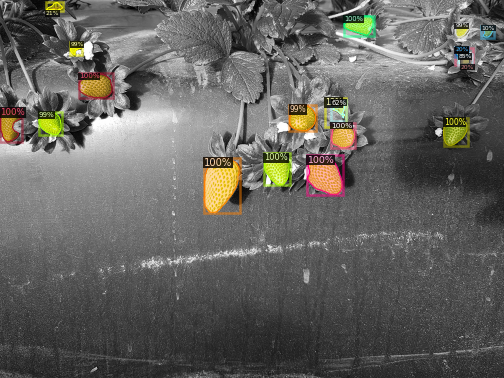

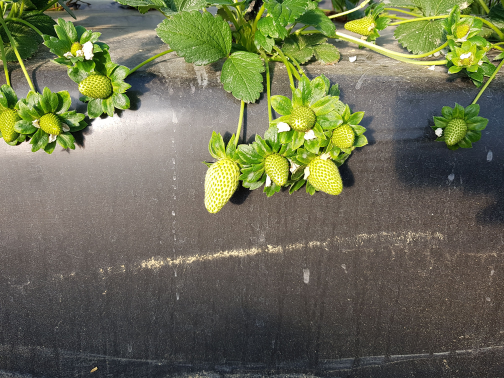

In [ ]:
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer, ColorMode
import matplotlib.pyplot as plt
import cv2
import os
from google.colab.patches import cv2_imshow


image_path = "/content/dataset/test/img/2718.png"

test_data = [{'file_name': image_path,
              'image_id': 2718}
             ]
metadata = MetadataCatalog.get("train")

for d in test_data:
        im = cv2.imread(d["file_name"])
        outputs = predictor(
            im)
        v = Visualizer(im[:, :, ::-1],
                       metadata=metadata,
                       scale=0.5,
                       instance_mode=ColorMode.IMAGE_BW
                       )
        out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
        img = cv2.cvtColor(out.get_image()[:, :, ::-1], cv2.COLOR_RGBA2RGB)
        #plt.imsave(os.path.join(os.path.join(cfg.OUTPUT_DIR, 'visualization'), str(d["image_id"]) + '.png'), img)
        cv2_imshow(img)

img = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
img = cv2.resize(img, (504, 378))
cv2_imshow(img)

## Make inference in a Video

### Run image segmentation on a video

Display the used YouTube video

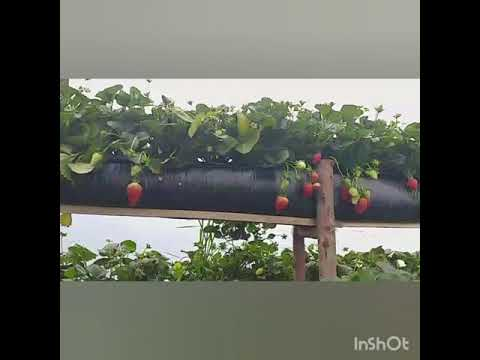

In [ ]:
# This is the video we're going to process
from IPython.display import YouTubeVideo, display
video = YouTubeVideo("qYcK9czeINg", width=500)
display(video)

In our particular case, we prefer to save the video in Google Drive (download the video manually using a website and the upload it to Google Drive) and then copy it to the local storage.

In [ ]:
!cp /content/gdrive/Shareddrives/Universidad/CV_strawberry_project/strawberry_detection_fruit/video_prueba/video.mp4 .

Extract only a part of the video in order to avoid processing all the video and expent time.

In [ ]:
!ffmpeg -i video.mp4 -t 00:00:35 -c:v copy video-clip.mp4

ffmpeg version 4.2.7-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 9 (Ubuntu 9.4.0-1ubuntu1~20.04.1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librsvg --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --e

Define the python script in order to run image segmentation using Mask RCNN over a video.

In [ ]:
import atexit
import bisect
import multiprocessing as mp
from collections import deque
import cv2
import torch

from detectron2.data import MetadataCatalog
from detectron2.engine.defaults import DefaultPredictor
from detectron2.utils.video_visualizer import VideoVisualizer
from detectron2.utils.visualizer import ColorMode, Visualizer


class VisualizationDemo(object):
    def __init__(self, cfg, instance_mode=ColorMode.IMAGE, parallel=False):
        """
        Args:
            cfg (CfgNode):
            instance_mode (ColorMode):
            parallel (bool): whether to run the model in different processes from visualization.
                Useful since the visualization logic can be slow.
        """
        self.metadata = MetadataCatalog.get(
            cfg.DATASETS.TEST[0] if len(cfg.DATASETS.TEST) else "__unused"
        )
        self.cpu_device = torch.device("cpu")
        self.instance_mode = instance_mode

        self.parallel = parallel
        if parallel:
            num_gpu = torch.cuda.device_count()
            self.predictor = AsyncPredictor(cfg, num_gpus=num_gpu)
        else:
            self.predictor = DefaultPredictor(cfg)

    def run_on_image(self, image):
        """
        Args:
            image (np.ndarray): an image of shape (H, W, C) (in BGR order).
                This is the format used by OpenCV.

        Returns:
            predictions (dict): the output of the model.
            vis_output (VisImage): the visualized image output.
        """
        vis_output = None
        predictions = self.predictor(image)
        # Convert image from OpenCV BGR format to Matplotlib RGB format.
        image = image[:, :, ::-1]
        visualizer = Visualizer(image, self.metadata, instance_mode=self.instance_mode)
        if "panoptic_seg" in predictions:
            panoptic_seg, segments_info = predictions["panoptic_seg"]
            vis_output = visualizer.draw_panoptic_seg_predictions(
                panoptic_seg.to(self.cpu_device), segments_info
            )
        else:
            if "sem_seg" in predictions:
                vis_output = visualizer.draw_sem_seg(
                    predictions["sem_seg"].argmax(dim=0).to(self.cpu_device)
                )
            if "instances" in predictions:
                instances = predictions["instances"].to(self.cpu_device)
                vis_output = visualizer.draw_instance_predictions(predictions=instances)

        return predictions, vis_output

    def _frame_from_video(self, video):
        while video.isOpened():
            success, frame = video.read()
            if success:
                yield frame
            else:
                break

    def run_on_video(self, video):
        """
        Visualizes predictions on frames of the input video.

        Args:
            video (cv2.VideoCapture): a :class:`VideoCapture` object, whose source can be
                either a webcam or a video file.

        Yields:
            ndarray: BGR visualizations of each video frame.
        """
        video_visualizer = VideoVisualizer(self.metadata, self.instance_mode)

        def process_predictions(frame, predictions):
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            if "panoptic_seg" in predictions:
                panoptic_seg, segments_info = predictions["panoptic_seg"]
                vis_frame = video_visualizer.draw_panoptic_seg_predictions(
                    frame, panoptic_seg.to(self.cpu_device), segments_info
                )
            elif "instances" in predictions:
                predictions = predictions["instances"].to(self.cpu_device)
                vis_frame = video_visualizer.draw_instance_predictions(frame, predictions)
            elif "sem_seg" in predictions:
                vis_frame = video_visualizer.draw_sem_seg(
                    frame, predictions["sem_seg"].argmax(dim=0).to(self.cpu_device)
                )

            # Converts Matplotlib RGB format to OpenCV BGR format
            vis_frame = cv2.cvtColor(vis_frame.get_image(), cv2.COLOR_RGB2BGR)
            return vis_frame

        frame_gen = self._frame_from_video(video)
        if self.parallel:
            buffer_size = self.predictor.default_buffer_size

            frame_data = deque()

            for cnt, frame in enumerate(frame_gen):
                frame_data.append(frame)
                self.predictor.put(frame)

                if cnt >= buffer_size:
                    frame = frame_data.popleft()
                    predictions = self.predictor.get()
                    yield process_predictions(frame, predictions)

            while len(frame_data):
                frame = frame_data.popleft()
                predictions = self.predictor.get()
                yield process_predictions(frame, predictions)
        else:
            for frame in frame_gen:
                yield process_predictions(frame, self.predictor(frame))


class AsyncPredictor:
    """
    A predictor that runs the model asynchronously, possibly on >1 GPUs.
    Because rendering the visualization takes considerably amount of time,
    this helps improve throughput a little bit when rendering videos.
    """

    class _StopToken:
        pass

    class _PredictWorker(mp.Process):
        def __init__(self, cfg, task_queue, result_queue):
            self.cfg = cfg
            self.task_queue = task_queue
            self.result_queue = result_queue
            super().__init__()

        def run(self):
            predictor = DefaultPredictor(self.cfg)

            while True:
                task = self.task_queue.get()
                if isinstance(task, AsyncPredictor._StopToken):
                    break
                idx, data = task
                result = predictor(data)
                self.result_queue.put((idx, result))

    def __init__(self, cfg, num_gpus: int = 1):
        """
        Args:
            cfg (CfgNode):
            num_gpus (int): if 0, will run on CPU
        """
        num_workers = max(num_gpus, 1)
        self.task_queue = mp.Queue(maxsize=num_workers * 3)
        self.result_queue = mp.Queue(maxsize=num_workers * 3)
        self.procs = []
        for gpuid in range(max(num_gpus, 1)):
            cfg = cfg.clone()
            cfg.defrost()
            cfg.MODEL.DEVICE = "cuda:{}".format(gpuid) if num_gpus > 0 else "cpu"
            self.procs.append(
                AsyncPredictor._PredictWorker(cfg, self.task_queue, self.result_queue)
            )

        self.put_idx = 0
        self.get_idx = 0
        self.result_rank = []
        self.result_data = []

        for p in self.procs:
            p.start()
        atexit.register(self.shutdown)

    def put(self, image):
        self.put_idx += 1
        self.task_queue.put((self.put_idx, image))

    def get(self):
        self.get_idx += 1  # the index needed for this request
        if len(self.result_rank) and self.result_rank[0] == self.get_idx:
            res = self.result_data[0]
            del self.result_data[0], self.result_rank[0]
            return res

        while True:
            # make sure the results are returned in the correct order
            idx, res = self.result_queue.get()
            if idx == self.get_idx:
                return res
            insert = bisect.bisect(self.result_rank, idx)
            self.result_rank.insert(insert, idx)
            self.result_data.insert(insert, res)

    def __len__(self):
        return self.put_idx - self.get_idx

    def __call__(self, image):
        self.put(image)
        return self.get()

    def shutdown(self):
        for _ in self.procs:
            self.task_queue.put(AsyncPredictor._StopToken())

    @property
    def default_buffer_size(self):
        return len(self.procs) * 5

Run the inference over the video.

In [ ]:
# Copyright (c) Facebook, Inc. and its affiliates.
import argparse
import glob
import multiprocessing as mp
import numpy as np
import os
import tempfile
import time
import warnings
import cv2
import tqdm

from detectron2.config import get_cfg
from detectron2.data.detection_utils import read_image
from detectron2.utils.logger import setup_logger

#from predictor import VisualizationDemo
from detectron2 import model_zoo
# constants
WINDOW_NAME = "COCO detections"


def test_opencv_video_format(codec, file_ext):
    with tempfile.TemporaryDirectory(prefix="video_format_test") as dir:
        filename = os.path.join(dir, "test_file" + file_ext)
        writer = cv2.VideoWriter(
            filename=filename,
            fourcc=cv2.VideoWriter_fourcc(*codec),
            fps=float(30),
            frameSize=(10, 10),
            isColor=True,
        )
        [writer.write(np.zeros((10, 10, 3), np.uint8)) for _ in range(30)]
        writer.release()
        if os.path.isfile(filename):
            return True
        return False



mp.set_start_method("spawn", force=True)
setup_logger(name="fvcore")
logger = setup_logger()

''' SET UP CONFIG '''
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
#cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.0  # set threshold for this model
cfg.MODEL.WEIGHTS = "/content/outputs/model_final.pth"
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.7
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7

demo = VisualizationDemo(cfg)

''' PROCESS VIDEO '''
video_path = "/content/video-clip.mp4"
video = cv2.VideoCapture(video_path)
width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
frames_per_second = video.get(cv2.CAP_PROP_FPS)
num_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))
basename = os.path.basename(video_path)
codec, file_ext = (
    ("x264", ".mkv") if test_opencv_video_format("x264", ".mkv") else ("mp4v", ".mp4")
)
if codec == ".mp4v":
    warnings.warn("x264 codec not available, switching to mp4v")

if os.path.isdir("video-output.mkv"):
    output_fname = os.path.join("video-output.mkv")
    output_fname = os.path.splitext(output_fname)[0] + file_ext
else:
    output_fname = "video-output.mkv"
#assert not os.path.isfile(output_fname), output_fname
output_file = cv2.VideoWriter(
    filename=output_fname,
    # some installation of opencv may not support x264 (due to its license),
    # you can try other format (e.g. MPEG)
    fourcc=cv2.VideoWriter_fourcc(*codec),
    fps=float(frames_per_second),
    frameSize=(width, height),
    isColor=True,
)
assert os.path.isfile(video_path)
for vis_frame in tqdm.tqdm(demo.run_on_video(video), total=num_frames):

  output_file.write(vis_frame)

video.release()
output_file.release()


[01/30 18:11:07 fvcore.common.checkpoint]: Loading checkpoint from /content/outputs/model_final.pth


100%|█████████▉| 1050/1051 [03:56<00:00,  4.44it/s]


Copy the infered video to Google Drive in order to download it and then visualize the result

In [ ]:
!cp /content/video-output.mkv /content/gdrive/Shareddrives/Universidad/CV_strawberry_project/strawberry_detection_fruit/models/strawberry_resnet50_AP83194_20230130_4K_iters_iter3600_lr1e-5

## IMPORTANT BLOGS THAT HELP ON THIS NOTEBOOK

https://eidos-ai.medium.com/training-on-detectron2-with-a-validation-set-and-plot-loss-on-it-to-avoid-overfitting-6449418fbf4e

To put antoher evaluation metrics: https://blog.csdn.net/weixin_42899627/article/details/119831887